In [1]:
import uproot
import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import pandas as pd
from  scipy.ndimage import uniform_filter1d

In [2]:
calib_filename="/pscratch/sd/n/noeroy/test_James/lrs_sanity_check/calibration/data_calib_v2.csv"
calib_csv = pd.read_csv(calib_filename, header=None)
calib_npy_data = calib_csv.to_numpy()

calib_filename="/pscratch/sd/n/noeroy/test_James/lrs_sanity_check/calibration/mc_calib.csv"
calib_csv = pd.read_csv(calib_filename, header=None)
calib_npy_mc = calib_csv.to_numpy()

In [3]:
masks_file = np.load("/pscratch/sd/n/noeroy/test_James/lrs_sanity_check/channel_sum_masks/TPC_masks_data.npz")
data_mask = np.array(masks_file['masks'])

masks_file = np.load("/pscratch/sd/n/noeroy/test_James/lrs_sanity_check/channel_sum_masks/TPC_masks_MC.npz")
mc_mask = np.array(masks_file['masks'])

In [4]:
class NdData:
    def __init__(self, filename):
        self.flow_file = h5.File(filename, 'r')

        self.data = self.flow_file['charge']['calib_prompt_hits']['data']
        self.event = self.flow_file['charge/events/data']
        self.match_region = self.flow_file['charge/events/ref/charge/calib_prompt_hits/ref_region']
        self.nd_time = self.event.fields("unix_ts")[:] + self.event.fields("ts_start")[:]/1e7
        self.nd_trigger = ((self.event.fields("unix_ts")[:] + self.event.fields("ts_start")[:]/1e7)).astype(int)


class Caf_file:
    def __init__(self, filename):
        self.file = uproot.open(filename)
        
        self.start_z_pandora = self.file["cafTree"]["rec.nd.lar.pandora.tracks.start.z"].array(library="np")
        self.end_z_pandora = self.file["cafTree"]["rec.nd.lar.pandora.tracks.end.z"].array(library="np")
        self.start_x_pandora = self.file["cafTree"]["rec.nd.lar.pandora.tracks.start.x"].array(library="np")
        self.end_x_pandora = self.file["cafTree"]["rec.nd.lar.pandora.tracks.end.x"].array(library="np")
        self.len_pandora = self.file["cafTree"]["rec.nd.lar.pandora.tracks.len_cm"].array(library="np")

        self.start_z_dlp = self.file["cafTree"]["rec.nd.lar.dlp.tracks.start.z"].array(library="np")
        self.end_z_dlp = self.file["cafTree"]["rec.nd.lar.dlp.tracks.end.z"].array(library="np")
        self.start_x_dlp = self.file["cafTree"]["rec.nd.lar.dlp.tracks.start.x"].array(library="np")
        self.end_x_dlp = self.file["cafTree"]["rec.nd.lar.dlp.tracks.end.x"].array(library="np")
        self.len_dlp = self.file["cafTree"]["rec.nd.lar.dlp.tracks.len_cm"].array(library="np")

        self.dlp_pdg = self.file["cafTree"]["rec.common.ixn.dlp.part.dlp.pdg"].array(library="np")
        
        self.lar_event = self.file["cafTree"]["rec.meta.lar2x2.event"].array(library="np")

def check_entries(mycaf):
    result = []
    result2 = []
    for sub_arr in mycaf.len_pandora:
        result.append((np.sum(sub_arr>70) == 1) & (np.sum(sub_arr<70) == 1) &  (np.sum(sub_arr<20) == 0))

    res = np.array(result)
    return res


def plot_view_nd( NdFlow, entry, view, ax, min_pe=0, plot_caf = True):
    
    colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6']
    nd_selection =  NdFlow.match_region[entry]

    x_nd = NdFlow.data.fields("x")[nd_selection[0]:nd_selection[1]]*10
    y_nd = NdFlow.data.fields("y")[nd_selection[0]:nd_selection[1]]*10
    z_nd = NdFlow.data.fields("z")[nd_selection[0]:nd_selection[1]]*10
    Q_nd = NdFlow.data.fields("Q")[nd_selection[0]:nd_selection[1]]*10
    time = NdFlow.data.fields("t_drift")[nd_selection[0]:nd_selection[1]]*10
    mask1 = (time<10e3)
    mask2 = (time>10e3) 
    coord =  x_nd
    min_coord = -640
    max_coord = 640
    title = "X view"
    y_title = "x [mm]"


    z_us = [-1870,-2420,-2420,-1870,-1870]
    z_ds = [1664,3075,3075,1664,1664]

    xx = [-1070, -1070, 1070, 1070, -1070]
    uu = [-880,-880,1259,1259,-880]
    
    uu = [-880,-880,1259,1259,-880]

    vv = [-1259,-1259,880,880,-1259]
    


    yy = [-1441, -1441, 1006, 1006, -1441]
    coord_mnv_wf = xx


    xx_nd1 = [-640,-640,-5,-5,-640] 
    zz_nd1 = [-640,-5,-5,-640,-640] 

    xx_nd2 = [-640,-640,-5,-5,-640] 

    tpc1_x = [-300,-300] 

    tpc1_z = [5,650]

    tpc2_x = [300,300] 

    tpc2_z = [-5,-640]
    
    zz_nd2 = [5,650,650,5,5] 

    xx_nd3 = [5,5,640,640,5] 
    zz_nd3 = [-640,-5,-5,-640,-640] 

    xx_nd4 = [5,5,640,640,5] 
    zz_nd4 = [5,650,650,5,5] 


    coord_nd_wf = xx_nd1



    if (x_nd.size>0):
        if min_coord > max_coord:
            tmp = min_coord
            min_coord = max_coord
            max_coord = tmp


        hist_nd = ax.hist2d(z_nd, coord, weights=Q_nd,bins=[np.linspace(-800,800,200),np.linspace(-800,800,200)], cmap='viridis_r', cmin=1e-4)
        # hist_nd2 = ax.hist2d(z_nd[mask2], coord[mask2], weights=Q_nd[mask2],bins=[np.linspace(-700,700,300),np.linspace(min_coord,max_coord,300)], cmap='viridis_r', cmin=1e-4)
        hist_nd[3].set_clim(vmin=0, vmax=50)


    ax.plot(zz_nd1,xx_nd1, color='black', linestyle='--',linewidth=.7)
    ax.plot(zz_nd2,xx_nd2, color='black', linestyle='--',linewidth=.7)
    ax.plot(zz_nd3,xx_nd3, color='black', linestyle='--',linewidth=.7)
    ax.plot(zz_nd4,xx_nd4, color='black', linestyle='--',linewidth=.7)
    
    ax.plot(tpc1_z,tpc1_x, color='black', linestyle='--',linewidth=.7)
    ax.plot(tpc2_z,tpc1_x, color='black', linestyle='--',linewidth=.7)
    ax.plot(tpc1_z,tpc2_x, color='black', linestyle='--',linewidth=.7)
    ax.plot(tpc2_z,tpc2_x, color='black', linestyle='--',linewidth=.7)


    if (plot_caf):
        start_z = mycaf.start_z_pandora * 10
        end_z = mycaf.end_z_pandora*10
    
        start_x = mycaf.start_x_pandora * 10
        end_x = mycaf.end_x_pandora*10
    
    
        start_z = mycaf.start_z_dlp * 10
        end_z = mycaf.end_z_dlp*10
    
        start_x = mycaf.start_x_dlp * 10
        end_x = mycaf.end_x_dlp*10
    
        entry_caf = np.where(mycaf.lar_event==entry)[0][0]
        for i in range(len(start_z[entry_caf])):
            ax.plot([start_z[entry_caf][i],end_z[entry_caf][i]],[start_x[entry_caf][i],end_x[entry_caf][i]])

    
    


def plot_2x2_time(NdFlow, entry, ax):
    

    nd_selection =  NdFlow.match_region[entry]
    # nd_selection =  NdFlow.match_region[NdFlow.nd_trigger==entry][0]
    time = NdFlow.data.fields("t_drift")[nd_selection[0]:nd_selection[1]] / 10.

    time = time[time<1e5]
    # print(time)
    # print(nd_selection)
    ax.hist(time ,histtype="stepfilled",bins=500, color="red",alpha=.7)

    ax.set_title("2x2 time", y=.9, pad=-14, fontsize=20)
    ax.set_xlabel("time [µs]", fontsize=15)
    ax.set_ylabel("hits", fontsize=20)
    ax.tick_params(axis='x', labelsize=15)
    ax.tick_params(axis='y', labelsize=15)
    
    ax.grid(which='both', axis="y",linestyle='--', linewidth='0.5', color='black')
    ax.grid(which='major', axis="x",linestyle='--', linewidth='0.5', color='black')
    ax.xaxis.set_label_coords(.98, -0.3)

    

def view_event_v4( NdFlow, trig, plot_caf = False, is_data=True, mx2_min_pe=0 ):

    fig = plt.figure(figsize=(20,10))
    
    gs = fig.add_gridspec(4,3)
    ax1 = fig.add_subplot(gs[:,0:1])

    x = np.arange(1000)*16/1000.
    
    
    match = NdFlow.flow_file["charge/events/ref/light/events/ref"][trig]
    trig_charge = match[0]
    trig_light = match[1]
    
    plot_view_nd( NdFlow, trig_charge,1,ax1,mx2_min_pe, plot_caf)

    z_pos = [-75,67,-76,67,-76,67,-76,67]
    x_pos = [45,45,15,15,-20,-20,-50,-50]
    TPC_mapping = [2,0,3,1,6,4,7,5]
    for i_tpc in range (8):
        i = TPC_mapping[i_tpc]
        ax1.text(z_pos[i]*10,x_pos[i]*10,f'{TPC_mapping[i]}',size=30,alpha=.5, color="red")

    ref_pos = NdFlow.flow_file["light/events/ref/light/flash/ref"][trig_light]
    rr = NdFlow.flow_file["light/events/ref/light/flash/ref_region"][trig_light]
    time_ns = NdFlow.flow_file["light/events/data"]["utime_ms"][trig_light] * 1000
    if (rr["start"] < rr["stop"]):
        # print("coucou")
    
        start = NdFlow.flow_file["light/events/ref/light/flash/ref"][rr["start"]:rr["stop"]][:,1][0]
        end = NdFlow.flow_file["light/events/ref/light/flash/ref"][rr["start"]:rr["stop"]][:,1][-1]+1
    
        tpc_pos = NdFlow.flow_file["light/flash/data"]["tpc"][start:end]
        sample_pos = NdFlow.flow_file["light/flash/data"]["sample_range"][start:end][:,0]
        max_pos = NdFlow.flow_file["light/flash/data"]["tot_max"][start:end]
    

    
    my_wfs = NdFlow.flow_file["light/wvfm/data"][trig_light]["samples"]
    TPC_mapping = [2,0,3,1,6,4,7,5]
    
    if is_data:
        calib_wfs = my_wfs * calib_npy_data[:, :, np.newaxis]
    else:
        calib_wfs = my_wfs * calib_npy_mc[:, :, np.newaxis]
    calib_wfs[0][18] = np.zeros(1000)
    wfs = calib_wfs - calib_wfs[:,:,:50].mean(axis=2)[..., np.newaxis]
    calib_wfs[0][18] = np.zeros(1000)


    if is_data :
        masks = data_mask
    else :
        masks = mc_mask
    wvfms_summed = np.zeros((masks.shape[0], 1000))
    for i in range(masks.shape[0]):
        wvfms_summed[ i, :] = np.sum(wfs[masks[i]==1, :], axis=(0))
    
    for i in range(8):
        ax_i = (i//2)
        ax_j = (i%2)+1
        # ax = axs[ax_i,ax_j]
        ax = fig.add_subplot(gs[ax_i, ax_j])
        i_wf = TPC_mapping[i]
        ax.plot(x,wvfms_summed[i_wf])
        ax.set_title(f'TPC {i_wf}',  y=.75, x =.75)
        ax.set_xlabel("time [µs]", fontsize=15)  
        ax.set_ylabel("pe", fontsize=15)
        ax.grid()
        if (rr["start"] < rr["stop"]):
            # print("hiboux")
            mask = (tpc_pos == i_wf)
            ax.scatter(sample_pos[mask]*16/1000., max_pos[mask],color='red')

    
    plt.show()
    return fig

In [5]:
NdFlow = NdData("/global/cfs/cdirs/dune/www/data/2x2/sandbox/v8/flow/packet-0050017-2024_07_09_00_04_33_CDT.FLOW.hdf5")

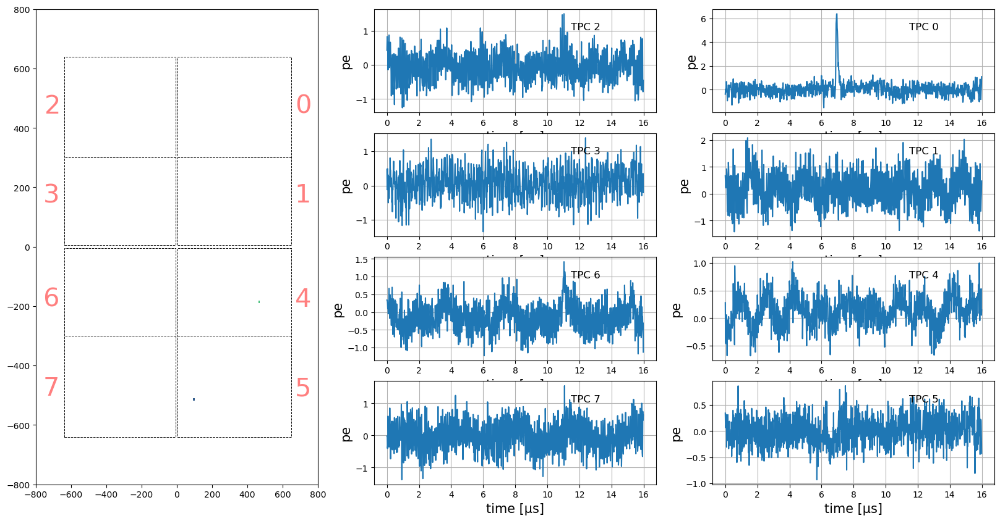

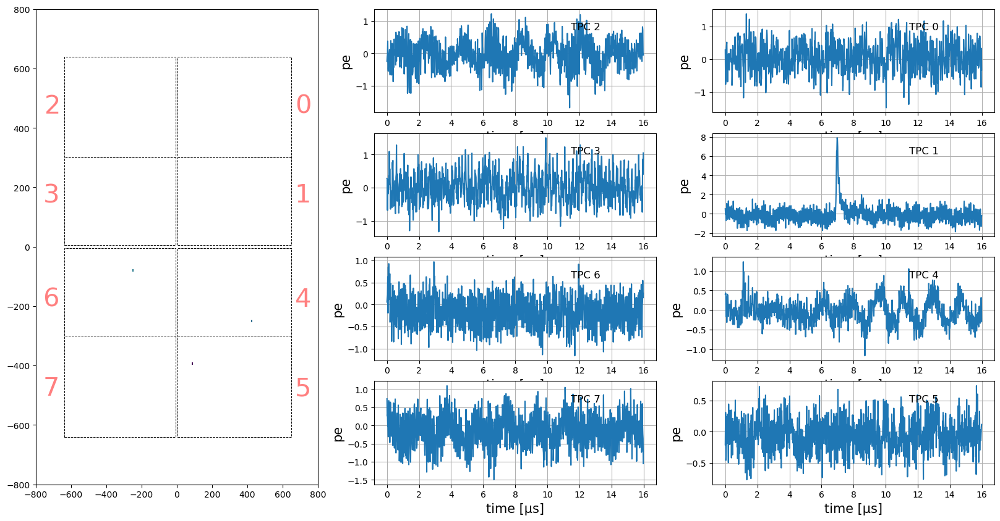

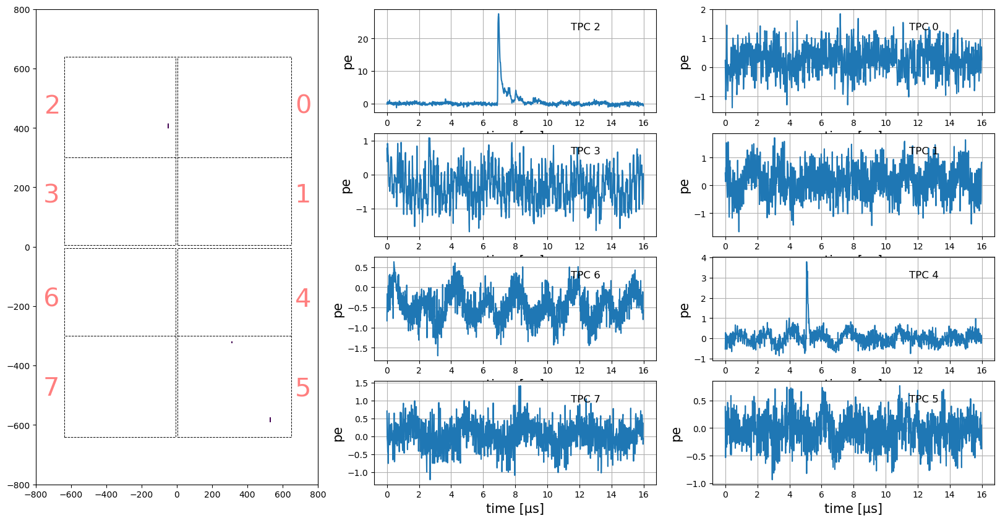

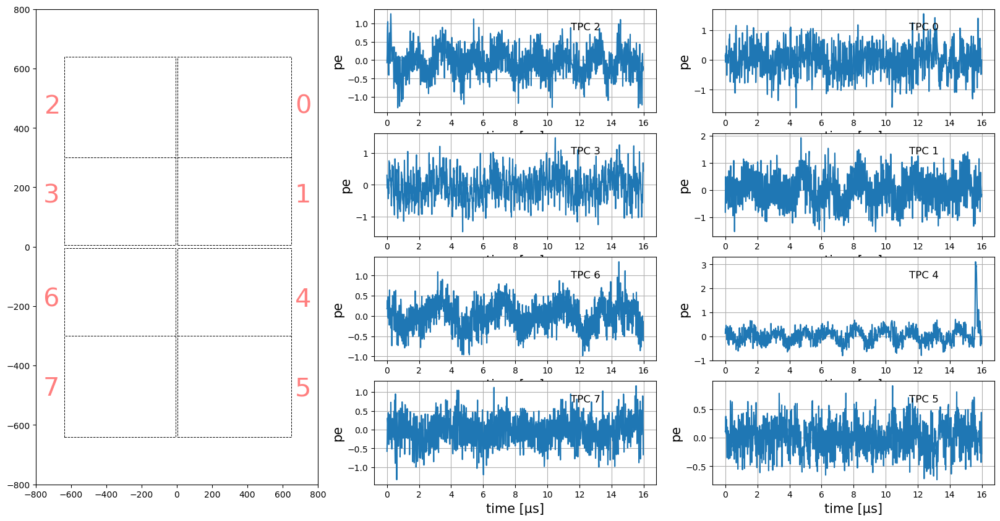

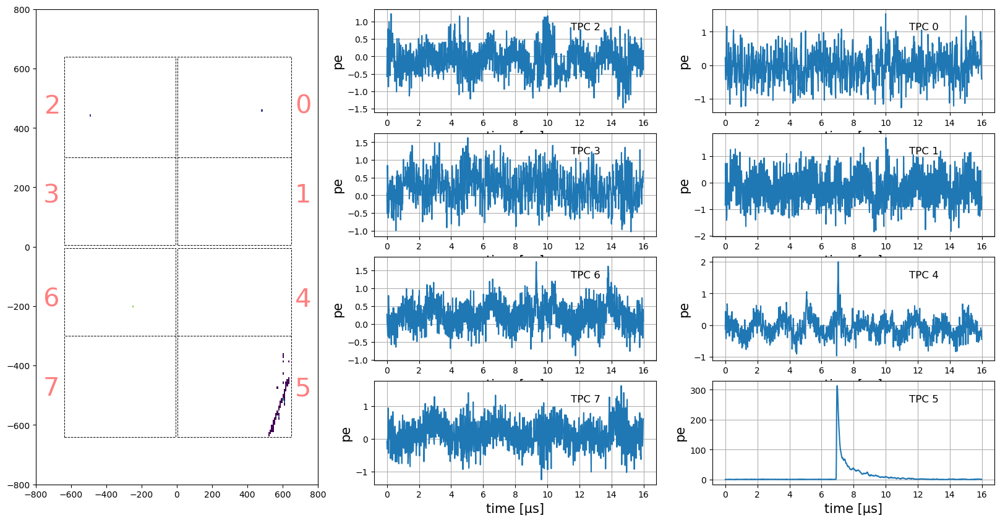

...

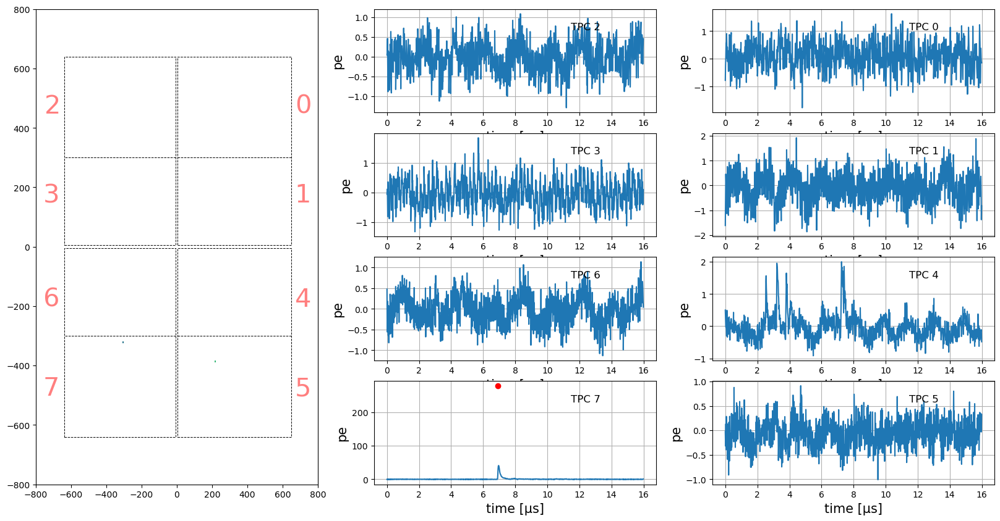

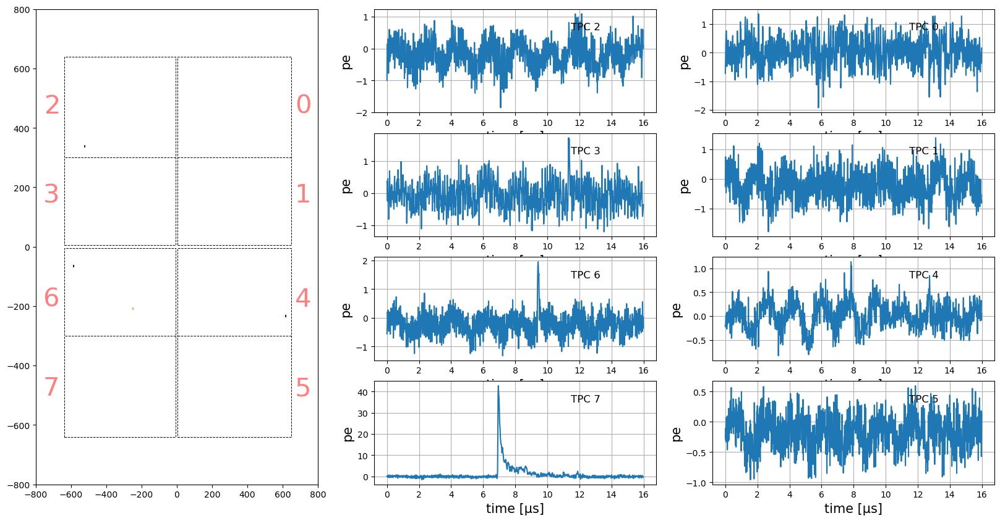

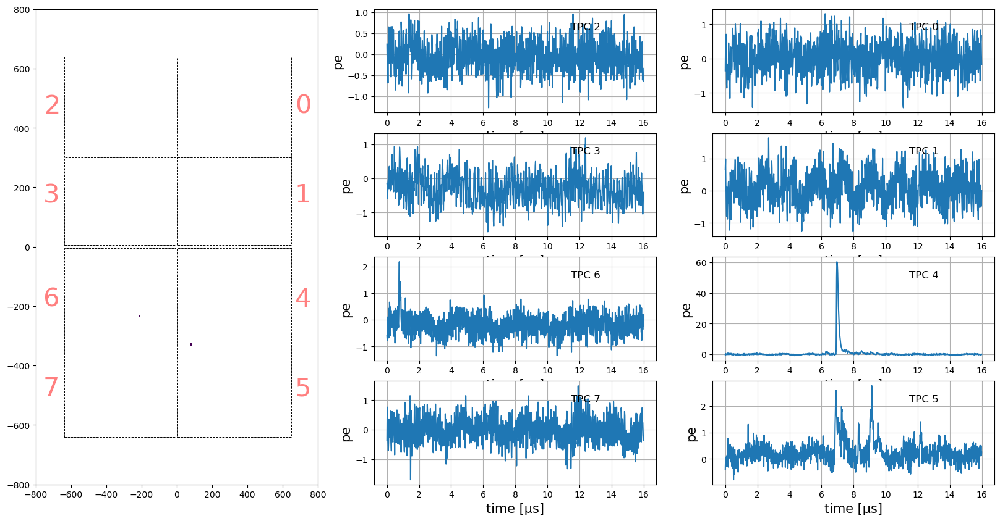

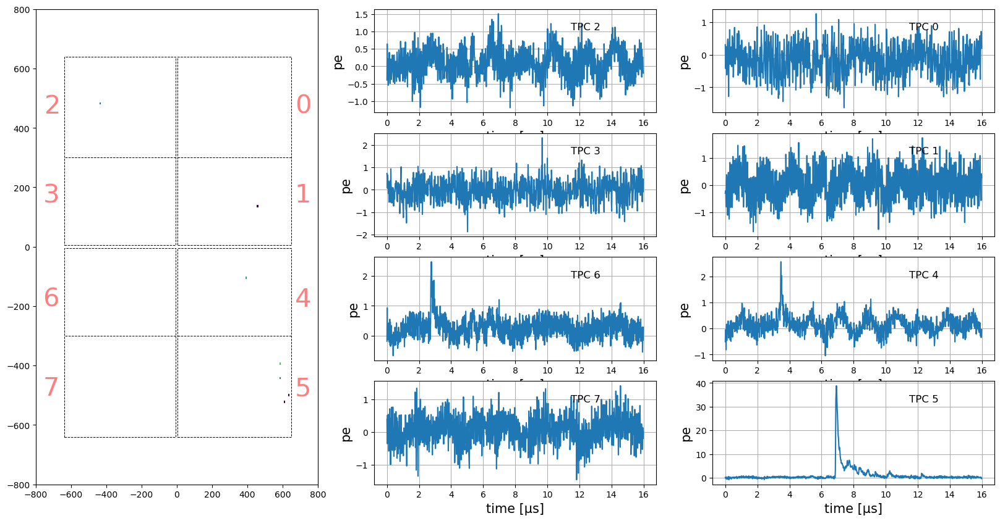

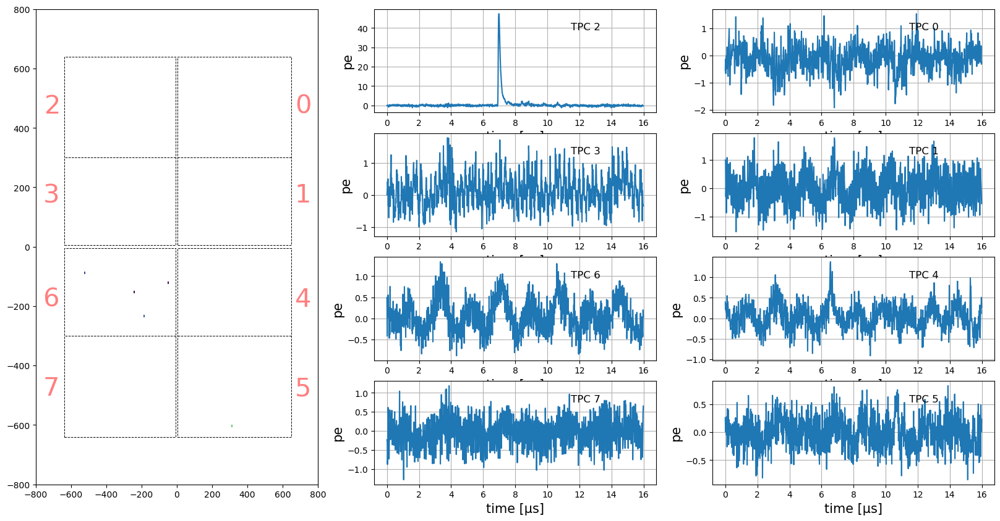

In [35]:
for i in range (30):
    f= view_event_v4(NdFlow, i, is_data=True )

In [30]:
NdFlow.flow_file["charge/events/ref/light/events/ref"][0]

array([322,   0], dtype=uint32)

In [6]:
NdFlow_sim = NdData("/pscratch/sd/n/noeroy/dev_area/ndlar_reflow/test_cl_01.h5")

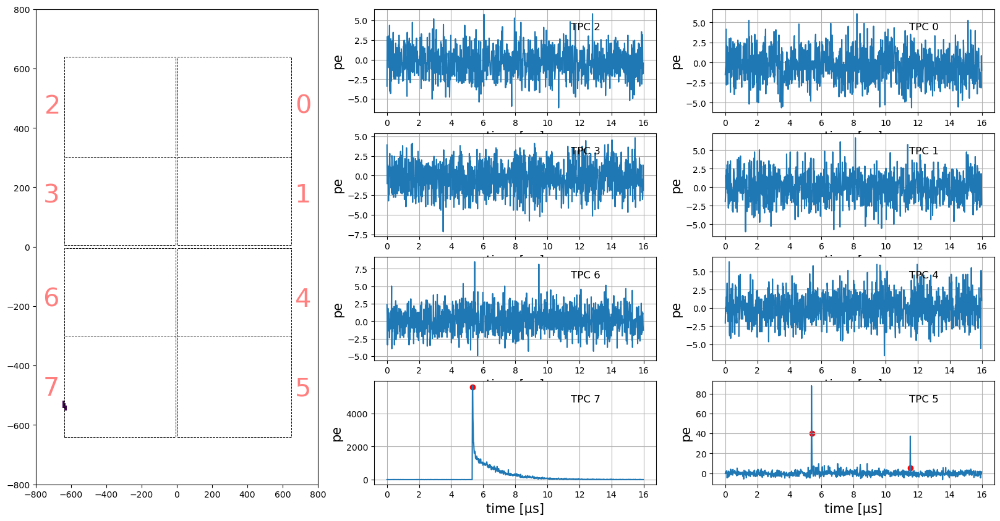

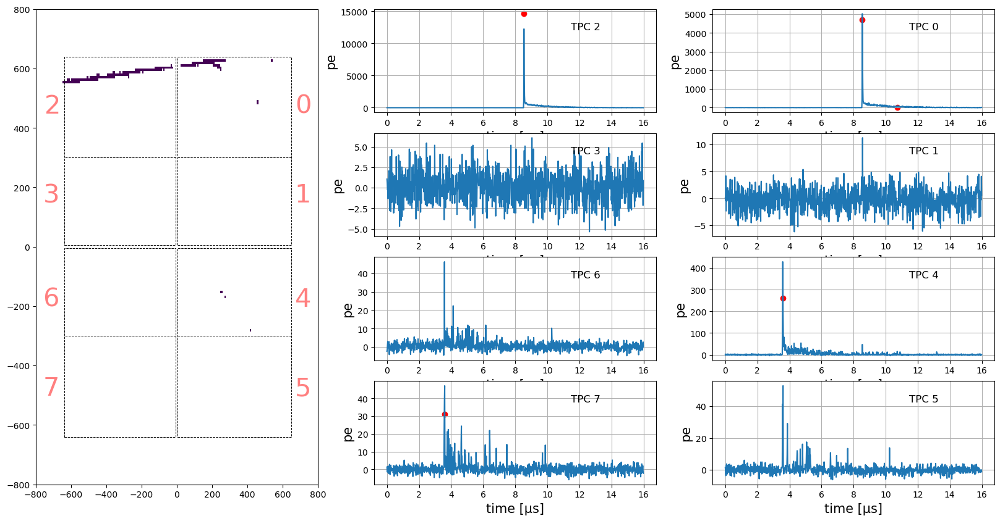

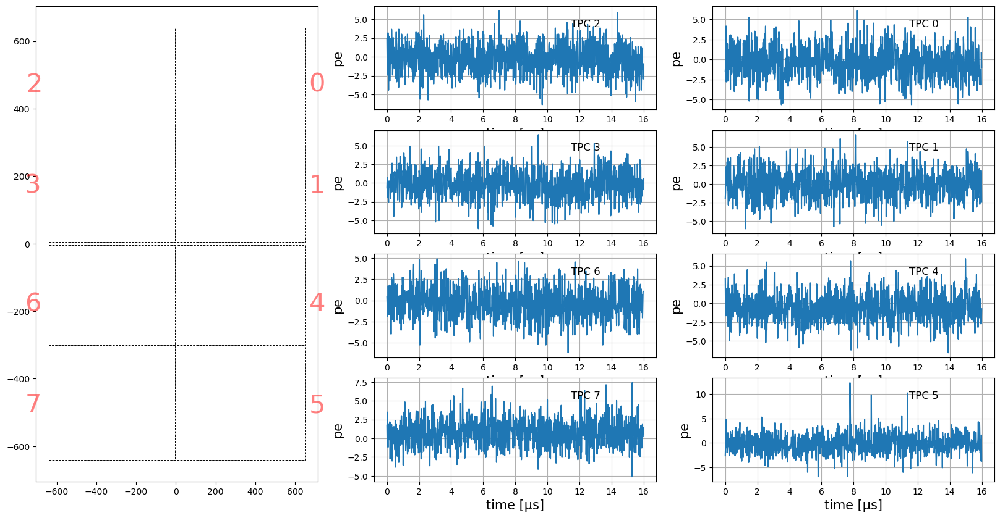

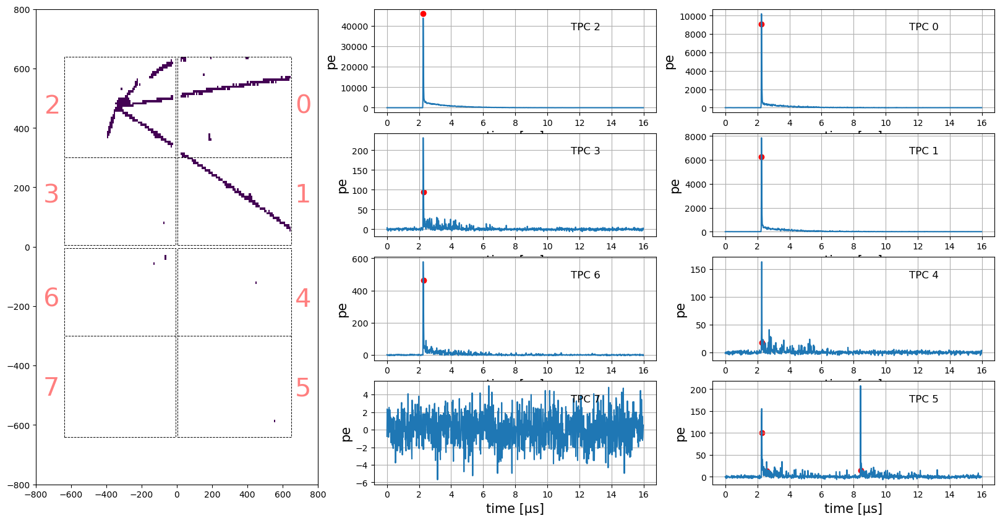

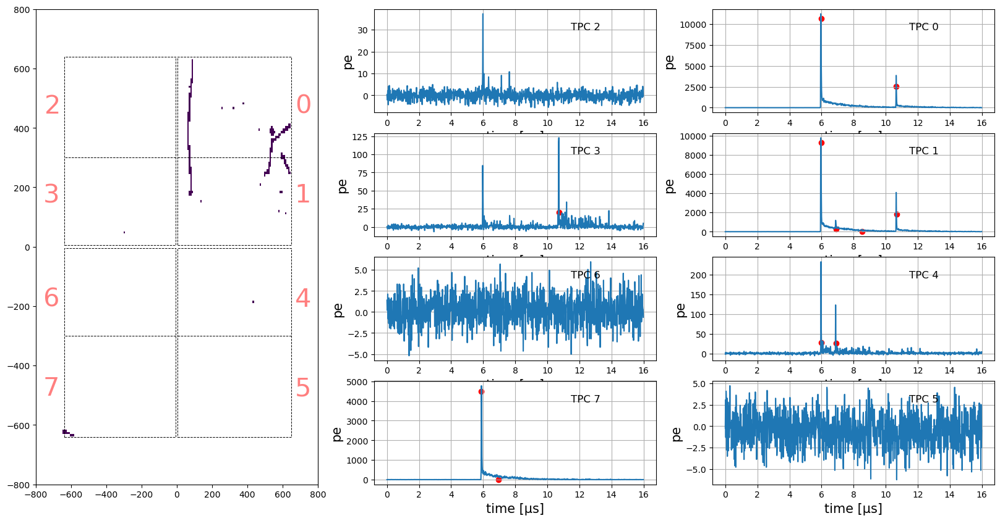

...

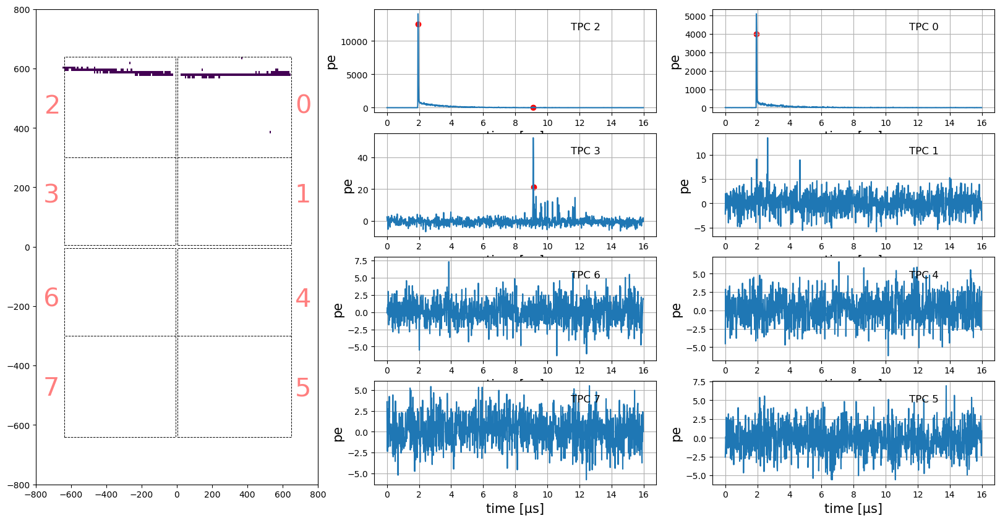

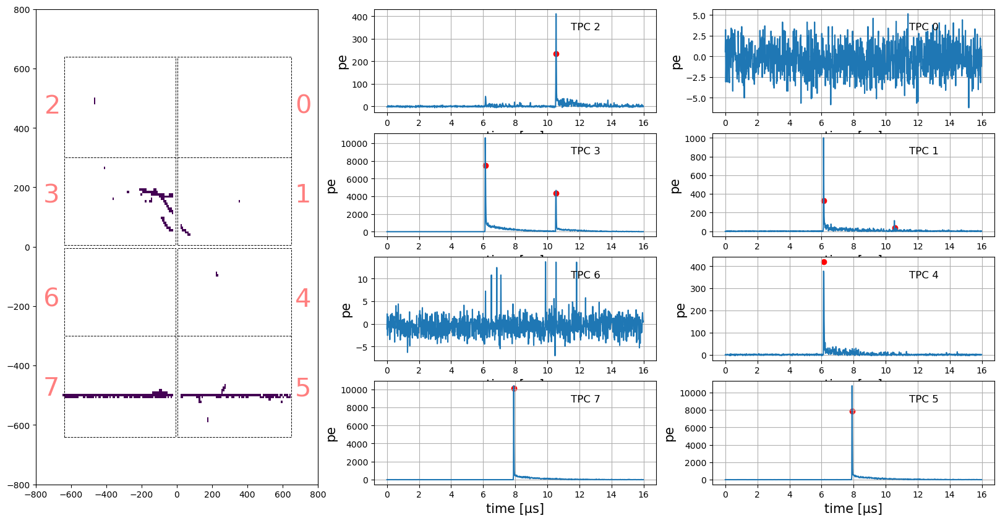

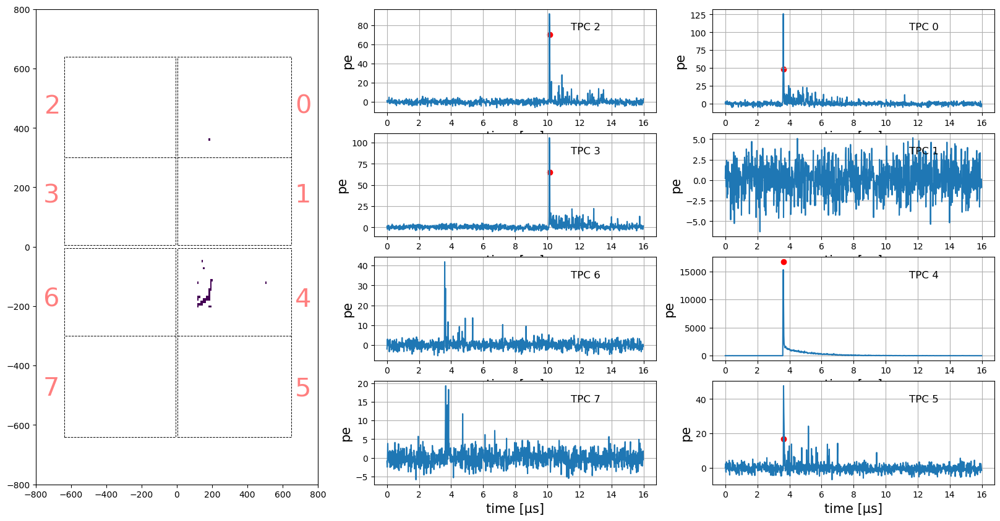

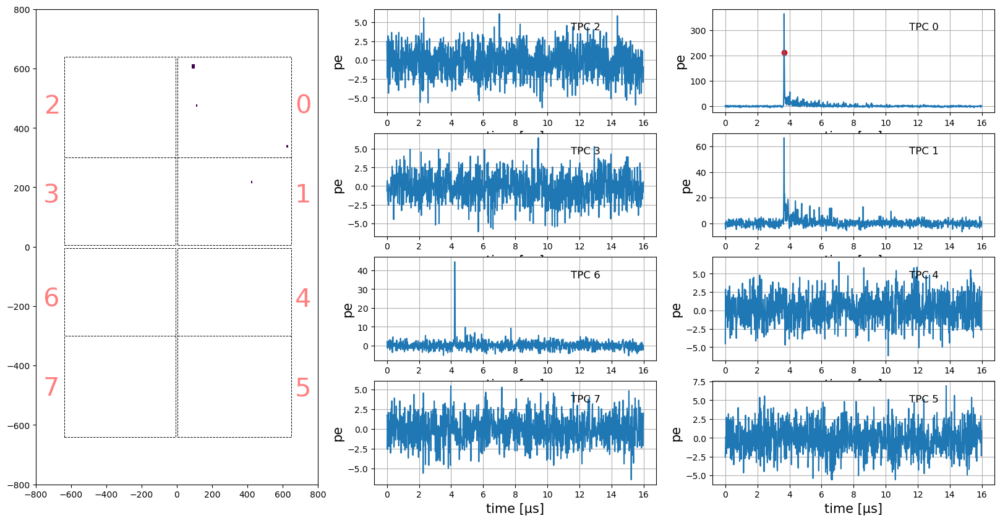

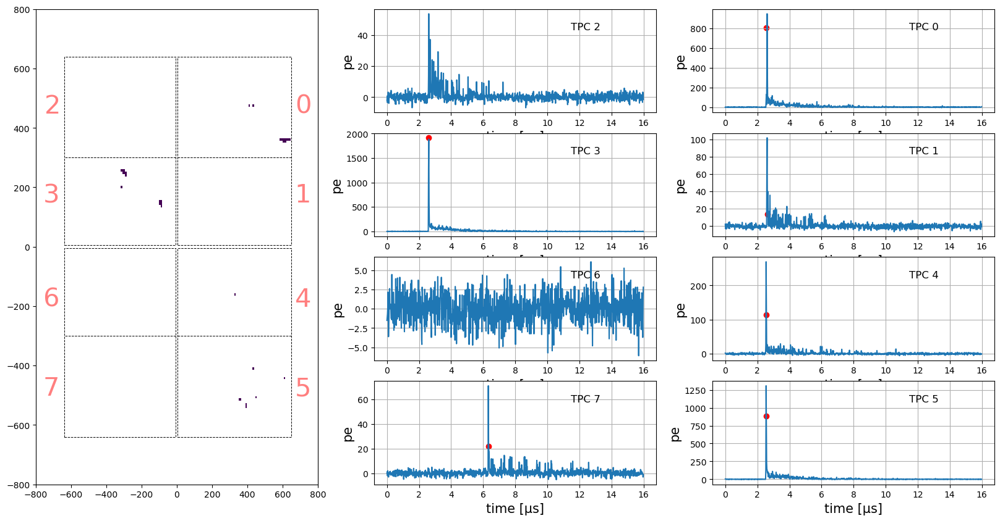

In [8]:
for i in range (30):
    f= view_event_v4(NdFlow_sim, i, is_data=False )